<a href="https://colab.research.google.com/github/dkalenov/predict-retailer-commissions/blob/main/Retailer_Commissions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Case

tasks using the provided dataset:

- Q1. What is the average company profit.
- Q2. Examine how ticket sales, prizes paid, and retailer commissions have changed over different fiscal years.
- Q3. Identify any seasonal patterns or anomalies.
- Q4. Predict retailer commissions based on ticket sales and other relevant variables.
- Q5. Split the data into training and testing sets, train a regression model, and evaluate its performance.

Note: May use visualizations that can clearly communicate your findings. (Preferred tableau)


- **County Name:**	 Physical county in Pennsylvania, determined by retailer sites and sales location.
- **State FiscalYear:**	 Pennsylvania State Fiscal Year running from July 1st to June 30th.
- **Ticket Sales:**	 Net sales of tickets in the county.
- **Prizes Paid:**	 Sum of all tickets actually paid in each county; the claim location may differ from the sales location, with prizes claimed at Lottery Headquarters sourced to Dauphin County.
- **Retailer Commissions:**	 Actual amount of money applied to a retailer’s account based on tickets sold, including bonus commissions and other amounts granted by regulation.
- **FIPS County Code:**	 5-digit Federal Information Processing Standard (FIPS) code designating the State association.
- **Latitude:**	 Latitude coordinates in degrees for a centroid point for geographic area.
-  **Longitude:** Longitude coordinates in degrees for a centroid point for geographic area.
- **Georeferenced Latitude & Longitude**:	 Georeferenced column as a point used for creating visuals.

## Functions for data processing and EDA

In [ ]:
# Function for displaying basic information about the dataset

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def basic_data_preprocessing(dataframe):
    # Convert all column titles to lowercase with "_" between words
    dataframe.columns = [x.lower().replace(' ', '_') for x in dataframe.columns.values]

    # Basic information about the dataset
    rows_num, columns_num = dataframe.shape
    print(f'Number of records: {rows_num}')
    print(f'Number of columns: {columns_num}\n')
    print('-' * 75)

    # Dataset information
    print("\nDataset Information:")
    display(dataframe.info())
    print()
    print('-' * 75)

    # Checking for missing values
    missing_values = dataframe.isnull().sum()
    if missing_values.sum() > 0:
        print("Missing values:")
        display(pd.DataFrame(missing_values, columns=['Missing Count']))
        display(dataframe[dataframe.isna().any(axis=1)])
    else:
        print("No missing values.")
    print('-' * 75)

    # Checking for zero-filled columns
    zero_columns = dataframe.columns[(dataframe == 0.0).any()]
    zero_count = dataframe[zero_columns].apply(lambda x: x.value_counts().get(0, 0))
    if zero_count.sum() != 0:
        print('Rows with value 0 found:')
        display(pd.DataFrame(zero_count, columns=['Zero Count']))
    else:
        print('No rows with value 0.')
    print('-' * 75)

    # Checking for duplicates
    if dataframe.duplicated().sum() > 0:
        print("Duplicate data found. Number of duplicates:", dataframe.duplicated().sum())
        display(dataframe[dataframe.duplicated(keep=False)])
    else:
        print("No duplicates found.")
    print('-' * 75)

    # Checking for negative values in the dataframe
    # Excluding columns with string data type (object type)
    dataframe_digits = dataframe.select_dtypes(exclude=['object'])
    if (dataframe_digits < 0).sum().sum() > 0:
        print("Negative values found:")
        display(pd.DataFrame((dataframe_digits < 0).sum(), columns=['Negative Value Count']))
    else:
        print('No negative values found.')
    print('-' * 75)

    # Statistical description of the data
    print("\nStatistical Description of the Data:\n")
    display(dataframe.describe())

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def detect_outliers(dataframe):
    outlier_table = pd.DataFrame(columns=['Column', 'Outlier Count', 'Outlier Percentage'])
    outliers_df = pd.DataFrame()  # DataFrame to store rows with outliers

    for column in dataframe.columns:
        if dataframe[column].dtype != 'object' and len(dataframe[column].unique()) == 2:
            print(f"No outliers in column '{column}' as it has binary values.")
            outlier_table = pd.concat([outlier_table,
                                       pd.DataFrame({'Column': [column],
                                                     'Outlier Count': ['NaN'],
                                                     'Outlier Percentage': ['NaN']})],
                                      ignore_index=True)
            print('*' * 75)
            print()
            continue

        if pd.api.types.is_numeric_dtype(dataframe[column]):
            q1 = dataframe[column].quantile(0.25)
            q3 = dataframe[column].quantile(0.75)
            iqr = q3 - q1
            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr

            outliers = dataframe[(dataframe[column] < lower_bound) | (dataframe[column] > upper_bound)]
            num_outliers = len(outliers)
            column_len = len(dataframe[column])

            if num_outliers == 0:
                print(f"No outliers in column '{column}'.")
                outlier_table = pd.concat([outlier_table,
                                           pd.DataFrame({'Column': [column],
                                                         'Outlier Count': [0],
                                                         'Outlier Percentage': [0]})],
                                          ignore_index=True)
            else:
                print(f"Outliers in column '{column}':")
                print(f"Outlier Count: {num_outliers}")
                print(f"Outlier Percentage of total observations: {(num_outliers / column_len) * 100:.2f}%")
                print("Outlier Values:", ", ".join(outliers[column].astype(str)))

                outlier_table = pd.concat([outlier_table,
                                           pd.DataFrame({'Column': [column],
                                                         'Outlier Count': [num_outliers],
                                                         'Outlier Percentage': [(num_outliers / column_len) * 100]})],
                                          ignore_index=True)

                # Append outliers to the outliers DataFrame
                outliers_df = pd.concat([outliers_df, outliers])

                fig, ax = plt.subplots(figsize=(8, 6))
                sns.boxplot(data=dataframe, x=column, ax=ax)
                ax.set_title(f"Outlier Plot for column '{column}'")
                plt.show()

        else:
            print(f"Skipping outlier detection for non-numeric column '{column}'")

        print('*' * 75)
        print()

    display(outlier_table)
    return outlier_table, outliers_df

In [ ]:
# Correlation analysis on a dataframe with a target feature using some specified correlation types

!pip install phik
from phik import phik_matrix

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

def correlation_analysis(dataframe, target_feature, correlation_types=['phik'], apply_abs=False):
    target_column = dataframe[target_feature]  # Target feature
    correlation_data = []  # List to store correlations
    interval_cols = [col for col in dataframe.columns if col != target_feature]  # Set interval columns for phik

    # Calculate correlation coefficients with the target feature for each column and specified correlation types
    for column in dataframe.columns:
        if column != target_feature:
            for corr_type in correlation_types:
                corr_value = None

                if corr_type == 'pearson':
                    corr_value = stats.pearsonr(target_column, dataframe[column])[0]
                elif corr_type == 'spearman':
                    corr_value = stats.spearmanr(target_column, dataframe[column]).correlation
                elif corr_type == 'kendall':
                    corr_value = stats.kendalltau(target_column, dataframe[column]).correlation
                elif corr_type == 'phik':
                    corr_value = phik_matrix(dataframe, interval_cols=interval_cols)[target_feature][column]
                # Apply absolute value, if specified
                if corr_value is not None and apply_abs:
                    corr_value = abs(corr_value)
                correlation_data.append((column, corr_type, corr_value))

    correlation_df = pd.DataFrame(correlation_data, columns=['Column', 'Correlation Type', 'Correlation Value'])  # Create DataFrame
    correlation_df_sorted = correlation_df.pivot(index='Column', columns='Correlation Type', values='Correlation Value')
    correlation_df_sorted = correlation_df_sorted[correlation_types]  # Keep only specified correlation types
    correlation_df_sorted = correlation_df_sorted.sort_values(by=correlation_types, ascending=False)  # Sort the data by specified correlation types

    # Correlation plot
    num_plots = len(correlation_types)
    fig_width = 20
    fig_height = 14
    fig, axes = plt.subplots(nrows=1, ncols=num_plots, figsize=(fig_width, fig_height))
    if num_plots == 1:
        axes = [axes]  # Ensure axes is a list even for a single subplot

    for i, corr_type in enumerate(correlation_types):
        corr_with_target = correlation_df_sorted[corr_type]
        corr_with_target_sorted = corr_with_target.sort_values(ascending=True)  # Sort the data

        # Set plot parameters
        sns.barplot(data=corr_with_target_sorted.reset_index(), x='Column', y=corr_type, ax=axes[i], color='dodgerblue')
        axes[i].set_xlabel('Features')
        axes[i].set_ylabel('Correlation')
        axes[i].set_title(corr_type)
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=75)

    plt.tight_layout(pad=1)
    plt.show()

    # Top 2 features with the highest correlation for each specified correlation type
    top_columns = {}
    for corr_type in correlation_types:
        sorted_columns = correlation_df_sorted[corr_type].abs().sort_values(ascending=False)
        top_columns[corr_type] = sorted_columns.index[:2].tolist()

    # Display correlation table
    print(f"Correlation table with target feature '{target_feature}':")
    display(correlation_df_sorted)
        # Display the top 2 features with the highest correlation for each correlation type
    for corr_type in correlation_types:
        print()
        print(f"Top 2 features with highest correlation ({corr_type.capitalize()}):", top_columns[corr_type])

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 11.8 MB/s eta 0:00:00


In [ ]:
# Function to find multicollinearity and print correlation matrix

import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from phik import phik_matrix

def find_multicollinearity(dataframe, methods=['phik'], threshold=0.8):
    # List to store all multicollinear tables
    multicollinear_tables = []

    # Iterate through each method in the list of methods
    for method in methods:
        # Convert method to lowercase
        method = method.lower()

        # Calculate correlation matrix using specified sort method
        if method in ['pearson', 'kendall', 'spearman']:
            corr_matrix = dataframe.corr(method=method).abs()
        elif method == 'phik':
            interval_cols = [col for col in dataframe.columns]
            corr_matrix = phik_matrix(dataframe, interval_cols=interval_cols)
        else:
            print(f"Invalid method: {method}")
            continue

        # Exclude correlation of a variable with itself
        np.fill_diagonal(corr_matrix.values, np.NaN)

        # Create a larger figure size based on the number of features
        n = corr_matrix.shape[0]
        fig_width = 6 + n * 0.5
        fig_height = 4 + n * 0.3

        # Plot correlation matrix as heatmap with adjusted figure size
        plt.figure(figsize=(fig_width, fig_height))
        sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, fmt=".2f", mask=np.isnan(corr_matrix))
        plt.title(f"Correlation Matrix ({method})")
        plt.show()

        # Initialize an empty list to store multicollinear features
        multicollinear_table = []

        # Iterate through each pair of multicollinear features and their correlation percentages
        for i in range(n):
            for j in range(i+1, n):
                # Check if the correlation between the two features is above the threshold
                if corr_matrix.iloc[i, j] > threshold:
                    feature1 = corr_matrix.columns[i]
                    feature2 = corr_matrix.columns[j]
                    # Append the pair of multicollinear features and their correlation percentage to the list
                    multicollinear_table.append({'Feature 1': feature1, 'Feature 2': feature2, 'Correlation': corr_matrix.iloc[i, j]})

        # Create a dataframe from the list of multicollinear features
        multicollinear_table = pd.DataFrame(multicollinear_table)

        if not multicollinear_table.empty:
            # Sort the multicollinear table by correlation in descending order
            multicollinear_table = multicollinear_table.sort_values(by='Correlation', ascending=False)
            # Append the multicollinear table to the list of multicollinear tables
            multicollinear_tables.append((method, multicollinear_table))

    # Print all multicollinear tables
    if multicollinear_tables:
        for method, table in multicollinear_tables:
            print(f"\nMulticollinearity Table ({method})")
            display(table)
    else:
        print("\nNo features with high multicollinearity!")

## Data Extraction & Pre-processing

In [ ]:
import pandas as pd

data = pd.read_excel('Candidate Dataset.xlsx', sheet_name='DataSet')
df = data.copy()
df.head()

,County Name,State Fiscal Year,Ticket Sales,Prizes Paid,Retailer Commissions,FIPS County Code,Latitude,Longitude,Georeferenced Latitude & Longitude
0,Lebanon,2010-2011,25163421.0,16879292,1352910.0,42075.0,40.367597,-76.461826,POINT (-76.46182575 40.367597)
1,Philadelphia,2010-2011,482418451.0,271563611,24839242.0,42101.0,40.004444,-75.140236,POINT (-75.140236 40.00444354)
2,Forest,2010-2011,2344095.0,1467063,124301.0,42053.0,41.513579,-79.237810,POINT (-79.23780995 41.51357876)
3,Adams,2010-2011,16020747.0,14805818,865786.0,42001.0,39.872096,-77.222243,POINT (-77.22224271 39.87209565)
4,Clinton,2010-2011,10164845.0,6180964,543356.0,42035.0,41.232863,-77.642838,POINT (-77.6428376 41.23286274)


In [ ]:
df.drop('Georeferenced Latitude & Longitude', axis=1, inplace=True)

In [ ]:
# Convert 'State Fiscal Year' to integer
df['State Fiscal Year'] = df['State Fiscal Year'].str.extract(r'(\d{4})-\d{4}', expand=False).astype('int')

In [ ]:
df['Prizes Paid'] = df['Prizes Paid'].astype(float)

### Basic Data Preprocessing

In [ ]:
basic_data_preprocessing(df)

Number of records: 828
Number of columns: 8

---------------------------------------------------------------------------

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 828 entries, 0 to 827
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   county_name           828 non-null    object 
 1   state_fiscal_year     828 non-null    int64  
 2   ticket_sales          804 non-null    float64
 3   prizes_paid           828 non-null    float64
 4   retailer_commissions  804 non-null    float64
 5   fips_county_code      804 non-null    float64
 6   latitude              804 non-null    float64
 7   longitude             804 non-null    float64
dtypes: float64(6), int64(1), object(1)
memory usage: 51.9+ KB


None


---------------------------------------------------------------------------
Missing values:


,Missing Count
county_name,0
state_fiscal_year,0
ticket_sales,24
prizes_paid,0
retailer_commissions,24
fips_county_code,24
latitude,24
longitude,24


,county_name,state_fiscal_year,ticket_sales,prizes_paid,retailer_commissions,fips_county_code,latitude,longitude
46,Out Of Country,2010,NaN,603.0,NaN,NaN,NaN,NaN
51,Out Of State,2010,NaN,8516327.0,NaN,NaN,NaN,NaN
107,Out Of State,2011,NaN,31945156.0,NaN,NaN,NaN,NaN
134,Out Of Country,2011,NaN,548.0,NaN,NaN,NaN,NaN
153,Out Of State,2012,NaN,9678663.0,NaN,NaN,NaN,NaN
171,Out Of Country,2012,NaN,26775.0,NaN,NaN,NaN,NaN
222,Out Of Country,2013,NaN,6541.0,NaN,NaN,NaN,NaN
225,Out Of State,2013,NaN,7982023.0,NaN,NaN,NaN,NaN
305,Out Of Country,2014,NaN,2981.0,NaN,NaN,NaN,NaN
343,Out Of State,2014,NaN,5977632.0,NaN,NaN,NaN,NaN


---------------------------------------------------------------------------
No rows with value 0.
---------------------------------------------------------------------------
No duplicates found.
---------------------------------------------------------------------------
Negative values found:


,Negative Value Count
state_fiscal_year,0
ticket_sales,0
prizes_paid,0
retailer_commissions,0
fips_county_code,0
latitude,0
longitude,804


---------------------------------------------------------------------------

Statistical Description of the Data:



,state_fiscal_year,ticket_sales,prizes_paid,retailer_commissions,fips_county_code,latitude,longitude
count,828.000000,8.040000e+02,8.280000e+02,8.040000e+02,804.000000,804.000000,804.000000
mean,2015.500000,6.177591e+07,3.849538e+07,3.416596e+06,42067.000000,40.818829,-77.619620
std,3.454139,9.322648e+07,5.704778e+07,5.211867e+06,38.702235,0.614355,1.640969
min,2010.000000,1.401705e+06,2.400000e+02,7.496100e+04,42001.000000,39.854804,-80.351074
25%,2012.750000,1.377705e+07,8.752428e+06,7.557922e+05,42033.000000,40.335011,-79.093335
50%,2015.500000,2.820165e+07,1.835632e+07,1.580970e+06,42067.000000,40.815095,-77.405775
75%,2018.250000,7.346140e+07,4.686302e+07,4.083365e+06,42101.000000,41.344598,-76.223324
max,2021.000000,7.329208e+08,4.631818e+08,4.573644e+07,42133.000000,41.994138,-75.032709



---


***Summary:***

In general, at this stage, no anomalies other than omissions have been noticed in the data. Incomplete records: mainly for **'Out Of State'** and **'Out Of Country'**.



---



Futher handling missing values: Analyze Out Of State and Out Of Country Records.

These records can be excluded from the analysis as they lack sufficient information for calculations.


### Distribution

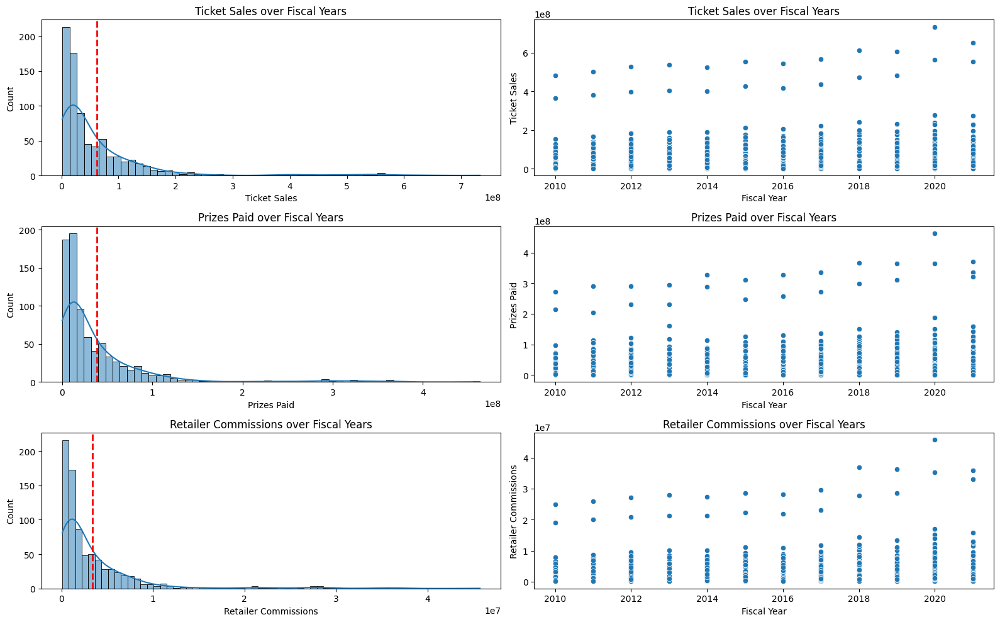

In [ ]:
# Create the 4 subplots
fig, axes = plt.subplots(3, 2, figsize=(16, 10))

# Plot ticket sales
sns.histplot(data=df, x='ticket_sales', kde=True, cumulative=False, ax=axes[0, 0])
axes[0, 0].set_title('Ticket Sales over Fiscal Years')
axes[0, 0].set_xlabel('Ticket Sales')
axes[0, 0].set_ylabel('Count')
axes[0, 0].axvline(x=df['ticket_sales'].mean(), color='r', linestyle='--', linewidth=2)

sns.scatterplot(data=df, x='state_fiscal_year', y='ticket_sales', ax=axes[0, 1])
axes[0, 1].set_title('Ticket Sales over Fiscal Years')
axes[0, 1].set_xlabel('Fiscal Year')
axes[0, 1].set_ylabel('Ticket Sales')


# Plot prizes paid
sns.histplot(data=df, x='prizes_paid', kde=True, cumulative=False, ax=axes[1, 0])
axes[1, 0].set_title('Prizes Paid over Fiscal Years')
axes[1, 0].set_xlabel('Prizes Paid')
axes[1, 0].set_ylabel('Count')
axes[1, 0].axvline(x=df['prizes_paid'].mean(), color='r', linestyle='--', linewidth=2)

sns.scatterplot(data=df, x='state_fiscal_year', y='prizes_paid', ax=axes[1, 1])
axes[1, 1].set_title('Prizes Paid over Fiscal Years')
axes[1, 1].set_xlabel('Fiscal Year')
axes[1, 1].set_ylabel('Prizes Paid')

# Plot retailer commissions
sns.histplot(data=df, x='retailer_commissions', kde=True, cumulative=False, ax=axes[2, 0])
axes[2, 0].set_title('Retailer Commissions over Fiscal Years')
axes[2, 0].set_xlabel('Retailer Commissions')
axes[2, 0].set_ylabel('Count')
axes[2, 0].axvline(x=df['retailer_commissions'].mean(), color='r', linestyle='--', linewidth=2)

sns.scatterplot(data=df, x='state_fiscal_year', y='retailer_commissions', ax=axes[2, 1])
axes[2, 1].set_title('Retailer Commissions over Fiscal Years')
axes[2, 1].set_xlabel('Fiscal Year')
axes[2, 1].set_ylabel('Retailer Commissions')

plt.tight_layout()
plt.show()

Data is skewed to the right, there are outliers

### Outliers

Skipping outlier detection for non-numeric column 'county_name'
***************************************************************************

No outliers in column 'state_fiscal_year'.
***************************************************************************

Outliers in column 'ticket_sales':
Outlier Count: 54
Outlier Percentage of total observations: 6.52%
Outlier Values: 482418451.0, 363008889.0, 381641961.0, 167521471.0, 500565887.0, 182604019.0, 525458222.0, 396095105.0, 188940167.0, 535223434.0, 402883489.0, 524321610.0, 401465777.0, 190224025.0, 425589773.0, 176931909.0, 553611531.0, 163177271.0, 210326052.0, 169456700.0, 206916245.0, 544060910.0, 415113339.0, 565276467.0, 170222480.0, 220819908.0, 436151860.0, 181659751.0, 171520358.0, 189815549.0, 612173911.0, 470954051.0, 240494560.0, 199314034.0, 480803543.0, 229840010.0, 174611383.0, 191156169.0, 603384038.0, 192200121.0, 563856385.0, 277122208.0, 197121569.0, 238520797.0, 175534349.0, 732920792.0, 227270043.0, 554065696.0

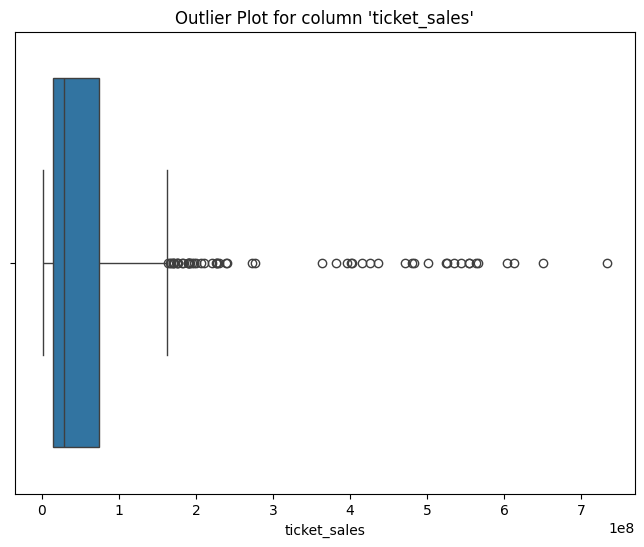

***************************************************************************

Outliers in column 'prizes_paid':
Outlier Count: 60
Outlier Percentage of total observations: 7.25%
Outlier Values: 271563611.0, 214465554.0, 113104442.0, 204796026.0, 105619077.0, 290428295.0, 290217054.0, 231330100.0, 122153610.0, 116605397.0, 295105774.0, 230190874.0, 161033390.0, 287698895.0, 326974599.0, 114047084.0, 247618081.0, 105292629.0, 106915347.0, 310916093.0, 125256627.0, 108961694.0, 130470116.0, 326653238.0, 256363999.0, 334823462.0, 109156986.0, 137035736.0, 104076314.0, 271549148.0, 111869571.0, 112088904.0, 119275817.0, 365662036.0, 298254719.0, 150242606.0, 124794408.0, 311440809.0, 139365433.0, 119724069.0, 114924513.0, 365137968.0, 127253664.0, 363634057.0, 186430035.0, 131550434.0, 150177809.0, 115312790.0, 106436273.0, 104389754.0, 463181763.0, 151152316.0, 335743175.0, 321835975.0, 158336778.0, 118680965.0, 125678718.0, 111791942.0, 369994972.0, 142845379.0


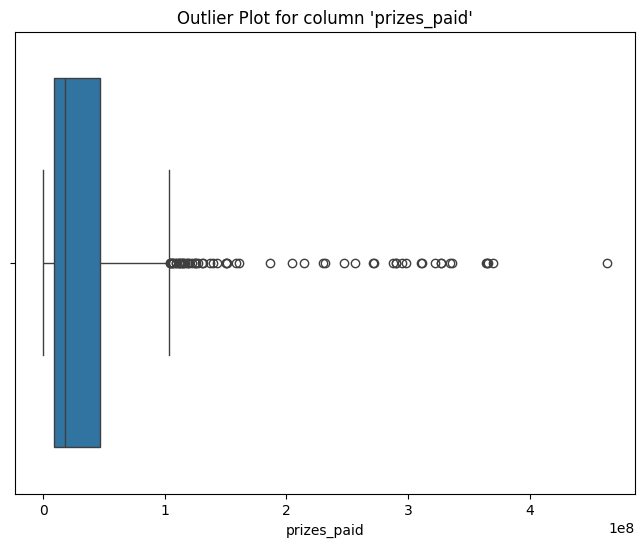

***************************************************************************

Outliers in column 'retailer_commissions':
Outlier Count: 52
Outlier Percentage of total observations: 6.28%
Outlier Values: 24839242.0, 18958181.0, 19999201.0, 25922711.0, 9572807.0, 27204243.0, 20846091.0, 10008926.0, 27928544.0, 21284680.0, 27310100.0, 21330936.0, 10073000.0, 22336604.0, 9288623.0, 28649325.0, 11039722.0, 10864174.0, 28187039.0, 21817532.0, 29479819.0, 11672957.0, 23160769.0, 9683750.0, 10153437.0, 11299054.0, 36793520.0, 27834631.0, 14261233.0, 11845953.0, 28453822.0, 13339100.0, 10176117.0, 11070587.0, 36164915.0, 11036892.0, 35184503.0, 16972611.0, 12116138.0, 15111447.0, 10939292.0, 9644505.0, 9570772.0, 45736438.0, 13932692.0, 32957679.0, 15691770.0, 11451681.0, 12612405.0, 9485131.0, 35917975.0, 12994323.0


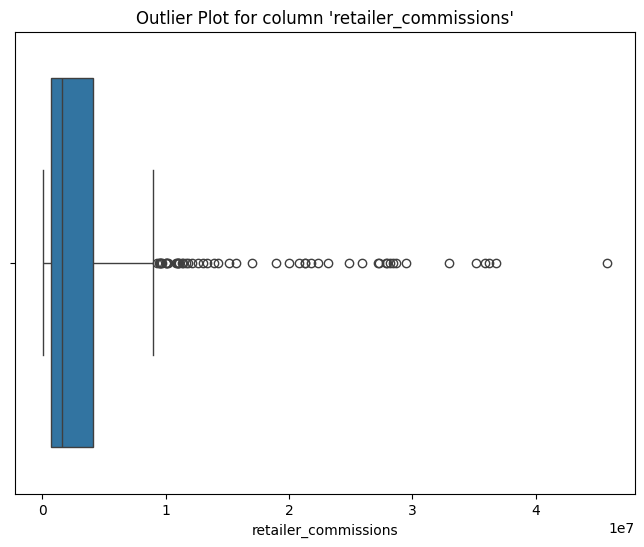

***************************************************************************

No outliers in column 'fips_county_code'.
***************************************************************************

No outliers in column 'latitude'.
***************************************************************************

No outliers in column 'longitude'.
***************************************************************************



,Column,Outlier Count,Outlier Percentage
0,state_fiscal_year,0,0
1,ticket_sales,54,6.521739
2,prizes_paid,60,7.246377
3,retailer_commissions,52,6.280193
4,fips_county_code,0,0
5,latitude,0,0
6,longitude,0,0


In [ ]:
outlier_table, outliers_df = detect_outliers(df)

- The 'state_fiscal_year' and 'fips_county_code', 'latitude', and 'longitude' columns do not have any outliers.
- The 'ticket_sales', 'prizes_paid', and 'retailer_commissions' columns have a significant number of outliers, ranging from 6.28% to 7.25% of the total rows.

Given the small amount of data, this percentage of outliers should not greatly affect model training. However, to avoid overfitting, I consider the following approaches:

1. LinearRegression model as baseline:

2. Ensemble Models:
Such models as Random Forest or Gradient Boosting, can be less sensitive to outliers compared to a single model.


### Data cleaning

In [ ]:
df_cleaned = df.copy()

In [ ]:
# Drop rows where ticket_sales or retailer_commissions is NaN ('Out Of Country' and 'Out Of State' rows)
df_cleaned = df_cleaned.dropna(subset=['ticket_sales', 'retailer_commissions'])

In [ ]:
# Ensure there are no negative values in the financial columns
df_cleaned = df_cleaned[(df_cleaned['ticket_sales'] >= 0) & (df_cleaned['prizes_paid'] >= 0) & (df_cleaned['retailer_commissions'] >= 0)]

In [ ]:
df_cleaned

,county_name,state_fiscal_year,ticket_sales,prizes_paid,retailer_commissions,fips_county_code,latitude,longitude
0,Lebanon,2010,25163421.0,16879292.0,1352910.0,42075.0,40.367597,-76.461826
1,Philadelphia,2010,482418451.0,271563611.0,24839242.0,42101.0,40.004444,-75.140236
2,Forest,2010,2344095.0,1467063.0,124301.0,42053.0,41.513579,-79.237810
3,Adams,2010,16020747.0,14805818.0,865786.0,42001.0,39.872096,-77.222243
4,Clinton,2010,10164845.0,6180964.0,543356.0,42035.0,41.232863,-77.642838
...,...,...,...,...,...,...,...,...
822,Crawford,2021,32265044.0,19045548.0,1754595.0,42039.0,41.685469,-80.113211
823,Bedford,2021,13569603.0,7721048.0,751677.0,42009.0,40.007375,-78.491165
824,Northampton,2021,98681017.0,56405881.0,5655763.0,42095.0,40.754595,-75.312637
825,Clarion,2021,16516794.0,10405396.0,924983.0,42031.0,41.192791,-79.424836


## Q1. What is the average company profit.

Profit = icket Sales − Prizes Paid − Retailer Commissions

In [ ]:
df_cleaned['profit'] = df_cleaned['ticket_sales'] - df_cleaned['prizes_paid'] - df_cleaned['retailer_commissions']
average_profit = round(df_cleaned['profit'].mean(), 2)

print(f"The average company profit is: {average_profit}$")

The average company profit is: 19422794.62$




---

Let's visualize data using **pygwalker** to analyze profit by *state_fiscal_year* and *county_name*

In [ ]:
!pip install pygwalker

In [ ]:
import pygwalker as pyg

pyg.walk(df_cleaned)

Box(children=(HTML(value='\n<div id="ifr-pyg-00061d305e479770DV8L7tsJkOdMCHpl" style="height: auto">\n    <hea…

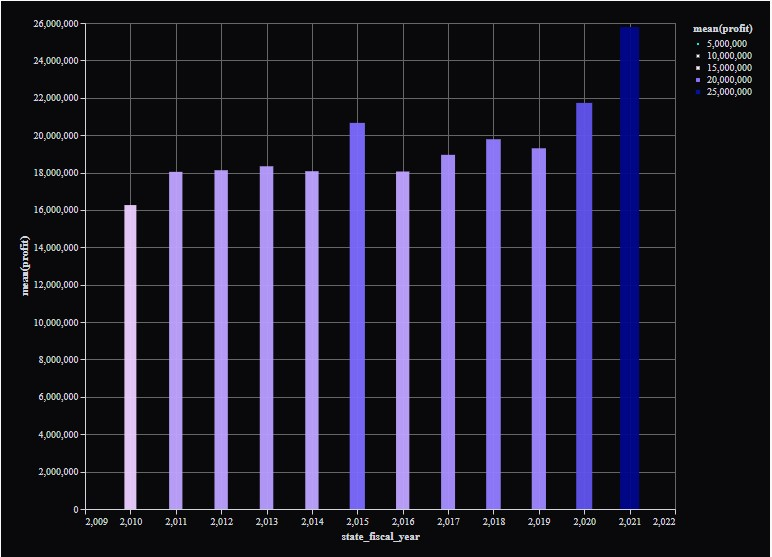

## Q2. Examine how ticket sales, prizes paid, and retailer commissions have changed over different fiscal years.

In [ ]:
# Group the data by fiscal year and calculate the mean/sum
grouped = df_cleaned.groupby('state_fiscal_year')[['ticket_sales',
                                          'prizes_paid',
                                          'retailer_commissions',
                                          'profit']].sum().reset_index()
grouped

,state_fiscal_year,ticket_sales,prizes_paid,retailer_commissions,profit
0,2010,3.207908e+09,1.949915e+09,168592817.0,1.089400e+09
1,2011,3.480901e+09,2.088554e+09,183888592.0,1.208458e+09
2,2012,3.699666e+09,2.289300e+09,196069704.0,1.214296e+09
3,2013,3.799568e+09,2.368693e+09,202369523.0,1.228506e+09
4,2014,3.819643e+09,2.405671e+09,203238185.0,1.210734e+09
5,2015,4.135165e+09,2.532920e+09,218298755.0,1.383946e+09
6,2016,4.001035e+09,2.579951e+09,211420782.0,1.209664e+09
7,2017,4.200565e+09,2.706910e+09,224175702.0,1.269479e+09
8,2018,4.503329e+09,2.911913e+09,266002882.0,1.325413e+09
9,2019,4.469474e+09,2.919094e+09,257451194.0,1.292928e+09


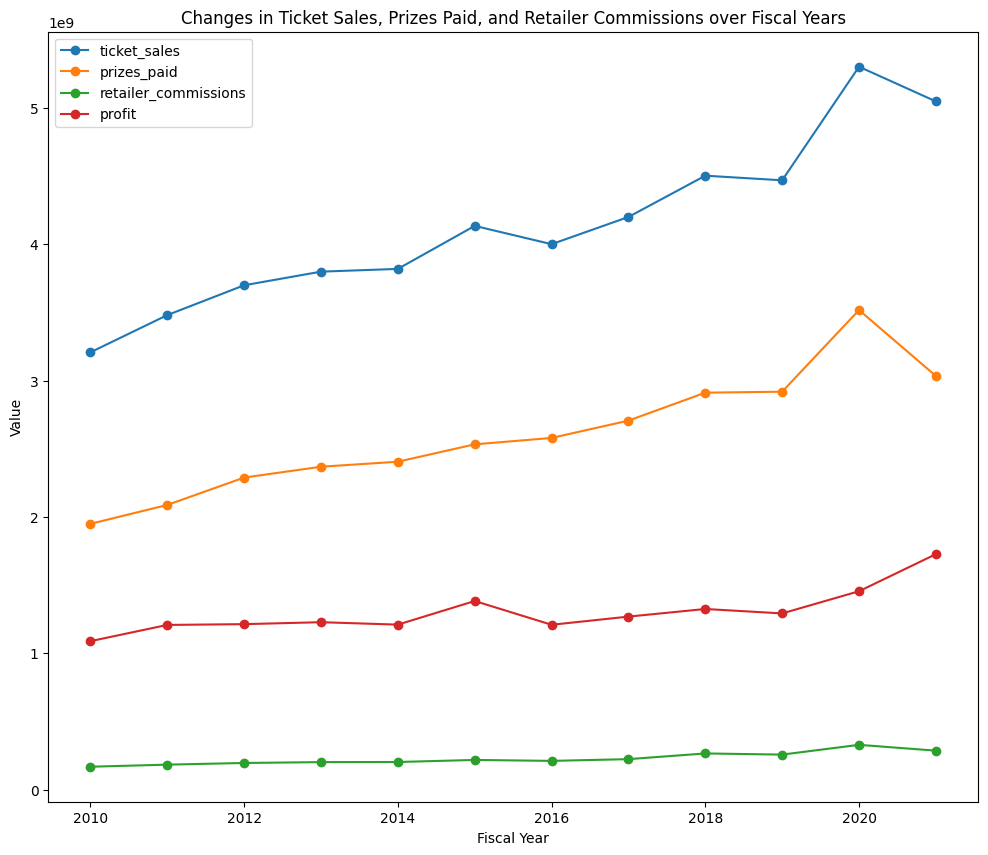

In [ ]:
import matplotlib.pyplot as plt

# Plot the changes over time
fig, ax = plt.subplots(figsize=(12, 10))
grouped.plot(x='state_fiscal_year', y=['ticket_sales', 'prizes_paid', 'retailer_commissions', 'profit'], marker='o', ax=ax)
ax.set_title('Changes in Ticket Sales, Prizes Paid, and Retailer Commissions over Fiscal Years')
ax.set_xlabel('Fiscal Year')
ax.set_ylabel('Value')
plt.legend()
plt.show()

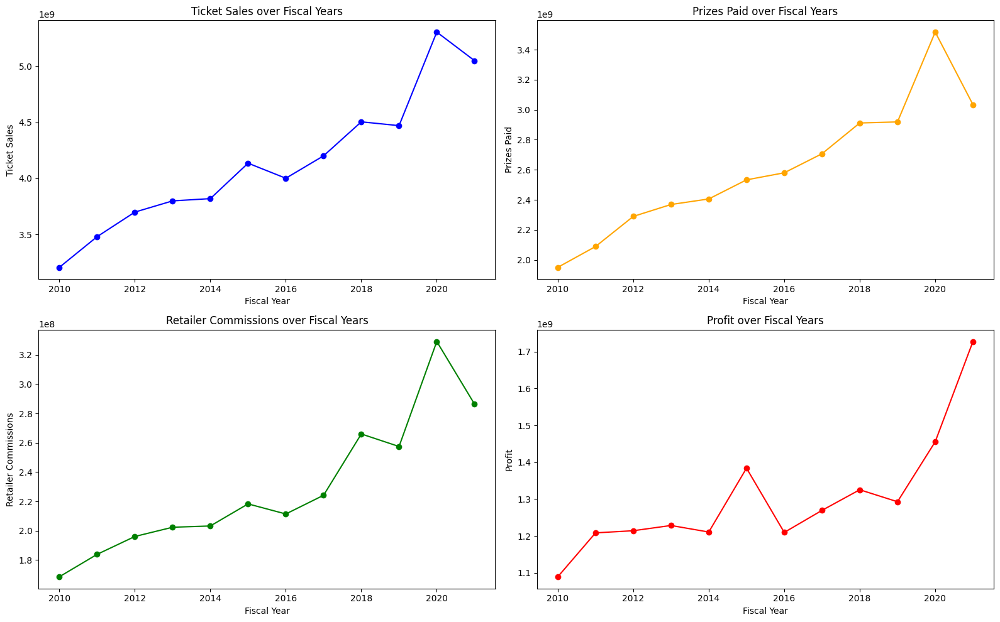

In [ ]:
# Create the 4 subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Plot ticket sales
axes[0, 0].plot(grouped['state_fiscal_year'], grouped['ticket_sales'], marker='o', color='b')
axes[0, 0].set_title('Ticket Sales over Fiscal Years')
axes[0, 0].set_xlabel('Fiscal Year')
axes[0, 0].set_ylabel('Ticket Sales')
# Plot prizes paid
axes[0, 1].plot(grouped['state_fiscal_year'], grouped['prizes_paid'], marker='o', color='orange')
axes[0, 1].set_title('Prizes Paid over Fiscal Years')
axes[0, 1].set_xlabel('Fiscal Year')
axes[0, 1].set_ylabel('Prizes Paid')

# Plot retailer commissions
axes[1, 0].plot(grouped['state_fiscal_year'], grouped['retailer_commissions'], marker='o', color='g')
axes[1, 0].set_title('Retailer Commissions over Fiscal Years')
axes[1, 0].set_xlabel('Fiscal Year')
axes[1, 0].set_ylabel('Retailer Commissions')

# Plot profit
axes[1, 1].plot(grouped['state_fiscal_year'], grouped['profit'], marker='o', color='r')
axes[1, 1].set_title('Profit over Fiscal Years')
axes[1, 1].set_xlabel('Fiscal Year')
axes[1, 1].set_ylabel('Profit')

plt.tight_layout()
plt.show()

**Summary:**

1. Ticket Sales: There is a steady growth in ticket sales from 2010 to 2020, reaching a peak in 2020.
2. Prizes Paid: Prize payouts also increased from 2010 to 2020, following the overall trend of ticket sales growth, reaching a peak in 2020.
3. Retailer Commissions: Retailer commissions gradually grew throughout the period.
4. Profit: Profit shows an overall increase from 2010 to 2021, reaching the maximum value in 2021. There is a sharp jump in profits in 2015, which may be due to the increase in ticket sales this year.


In [ ]:
# Group the data by fiscal year and calculate the mean/sum
grouped_2014_2016 = df_cleaned[df_cleaned['state_fiscal_year'].isin(range(2012, 2017))].groupby('state_fiscal_year')[['ticket_sales',
                                          'prizes_paid',
                                          'retailer_commissions',
                                          'profit']].sum().reset_index()
grouped_2014_2016

,state_fiscal_year,ticket_sales,prizes_paid,retailer_commissions,profit
0,2012,3.699666e+09,2.289300e+09,196069704.0,1.214296e+09
1,2013,3.799568e+09,2.368693e+09,202369523.0,1.228506e+09
2,2014,3.819643e+09,2.405671e+09,203238185.0,1.210734e+09
3,2015,4.135165e+09,2.532920e+09,218298755.0,1.383946e+09
4,2016,4.001035e+09,2.579951e+09,211420782.0,1.209664e+09


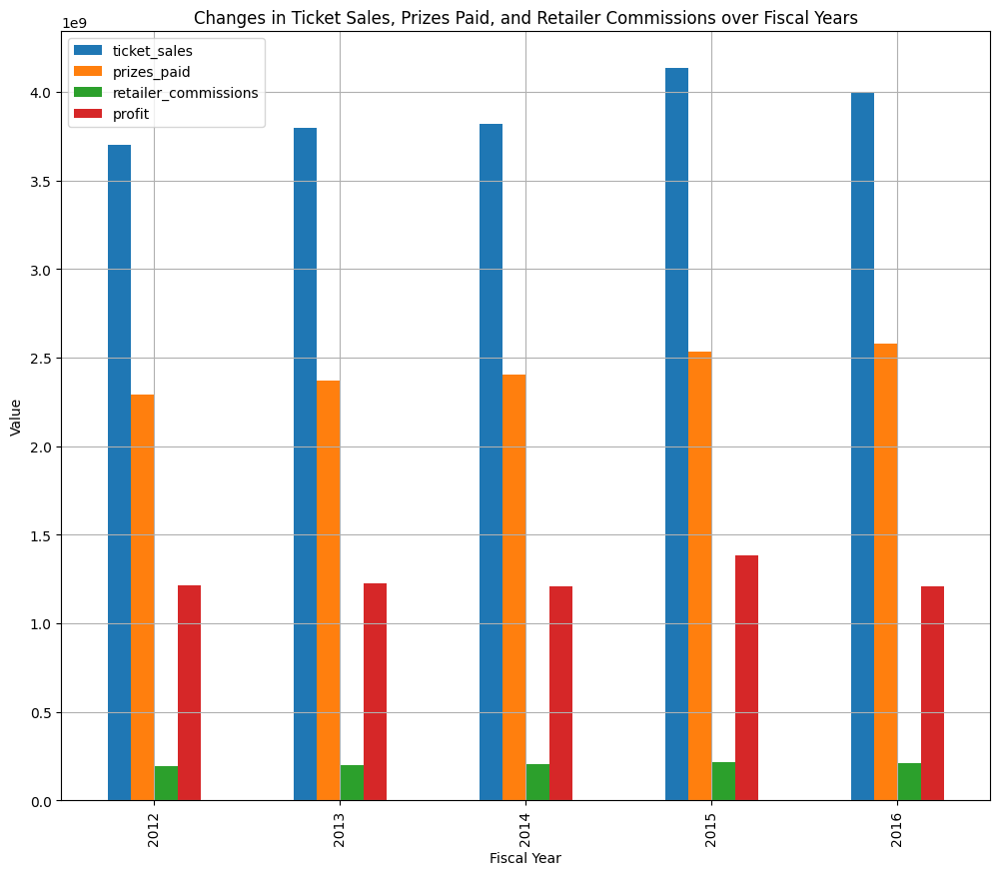

In [ ]:
# Plot the changes over time
fig, ax = plt.subplots(figsize=(12, 10)) # Use plt.subplots to create the figure and axes
grouped_2014_2016.plot(x='state_fiscal_year', y=['ticket_sales', 'prizes_paid', 'retailer_commissions', 'profit'], kind='bar', ax=ax) # Use kind='bar' to specify a bar plot
ax.set_title('Changes in Ticket Sales, Prizes Paid, and Retailer Commissions over Fiscal Years')
ax.set_xlabel('Fiscal Year')
ax.set_ylabel('Value')
plt.grid()
plt.legend()
plt.show()

The graph shows that in 2015 the increase in the ticket_sales was greater than the increase in prizes_paid, which influenced the growth of total profits.

## Q3.Identify any seasonal patterns or anomalies.

Fiscal year data may show broader trends over several years, but will not reveal short-term seasonal variations, so let's just focus on trends (overall and by county) and possible anomalies.

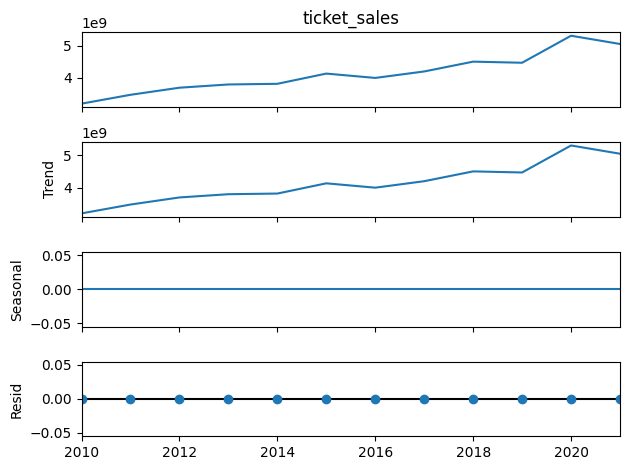

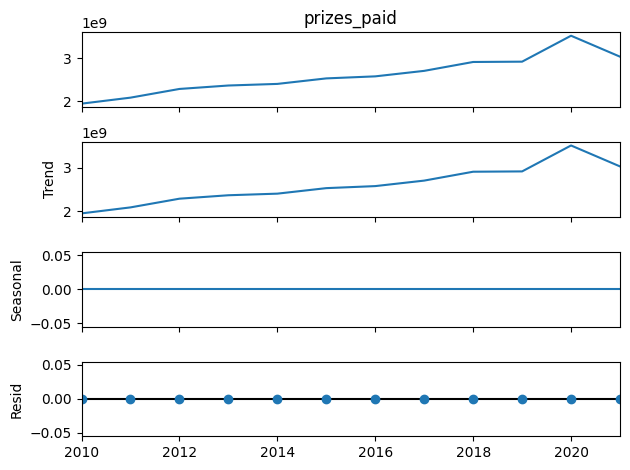

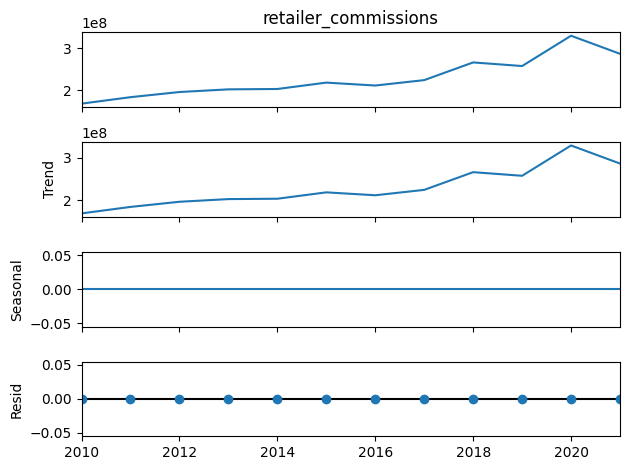

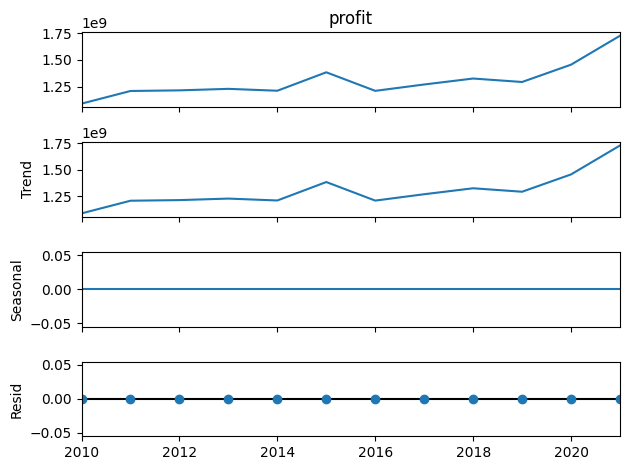

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Define the variables to decompose
variables = ['ticket_sales', 'prizes_paid', 'retailer_commissions', 'profit']

# Iterate through each variable and decompose the time series
for variable in variables:
    result = seasonal_decompose(grouped.set_index('state_fiscal_year')[variable], model='additive', period=1)

    # Plot the decomposition
    result.plot()
    plt.show()


**Summary:**

1. **Trend:** There is a clear increasing trend in data over the years.

2. **Seasonal:** No significant seasonality is detected in the ticket_sales data.

3. **Residual:** The residuals are minimal, suggesting that the model's trend component captures most of the data variability.

4. **Anomalies:**
There no any significant anomalies in the data. The fluctuations in the observed data are well accounted for by the trend, and the residuals are minimal.


Overall, the data shows a strong increasing trend in *ticket sales, prizes paid, retailer_commissions, and profit* with no significant seasonal pattern or anomalies detected.



---

Let's check for trends in data outliers.


In [ ]:
df_outliers_ticket_sales = pd.DataFrame(columns=df_cleaned.columns)
df_outliers_prizes_paid = pd.DataFrame(columns=df_cleaned.columns)
df_outliers_retailer_commissions = pd.DataFrame(columns=df_cleaned.columns)
df_outliers_profit = pd.DataFrame(columns=df_cleaned.columns)

In [ ]:
features = ['ticket_sales', 'prizes_paid', 'retailer_commissions', 'profit']

for col in features:

    Q1 = df_cleaned[col].quantile(0.25)
    Q3 = df_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1

    outliers = df_cleaned.loc[(df_cleaned[col] < Q1 - 1.5 * IQR) | (df_cleaned[col] > Q3 + 1.5 * IQR)]

    if col == 'ticket_sales':
        df_outliers_ticket_sales = pd.concat([df_outliers_ticket_sales, outliers], ignore_index=True)
    elif col == 'prizes_paid':
        df_outliers_prizes_paid = pd.concat([df_outliers_prizes_paid, outliers], ignore_index=True)
    elif col == 'retailer_commissions':
        df_outliers_retailer_commissions = pd.concat([df_outliers_retailer_commissions, outliers], ignore_index=True)
    elif col == 'profit':
        df_outliers_profit = pd.concat([df_outliers_profit, outliers], ignore_index=True)

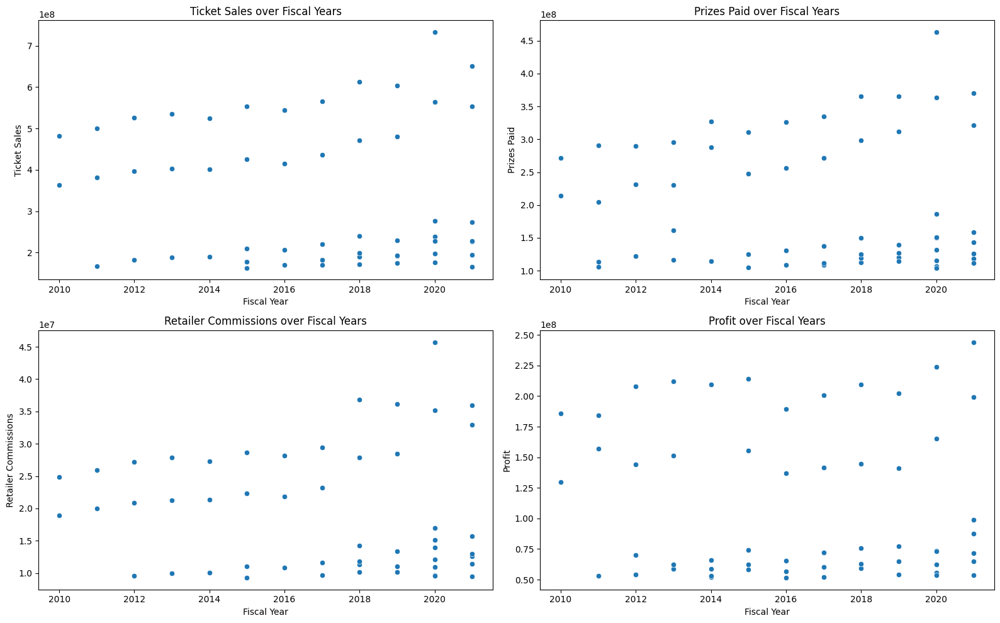

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Plot ticket sales
sns.scatterplot(data=df_outliers_ticket_sales, x='state_fiscal_year', y='ticket_sales', ax=axes[0, 0])
axes[0, 0].set_title('Ticket Sales over Fiscal Years')
axes[0, 0].set_xlabel('Fiscal Year')
axes[0, 0].set_ylabel('Ticket Sales')

# Plot prizes paid
sns.scatterplot(data=df_outliers_prizes_paid, x='state_fiscal_year', y='prizes_paid', ax=axes[0, 1])
axes[0, 1].set_title('Prizes Paid over Fiscal Years')
axes[0, 1].set_xlabel('Fiscal Year')
axes[0, 1].set_ylabel('Prizes Paid')

# Plot retailer commissions
sns.scatterplot(data=df_outliers_retailer_commissions, x='state_fiscal_year', y='retailer_commissions', ax=axes[1, 0])
axes[1, 0].set_title('Retailer Commissions over Fiscal Years')
axes[1, 0].set_xlabel('Fiscal Year')
axes[1, 0].set_ylabel('Retailer Commissions')

# Plot profit
sns.scatterplot(data=df_outliers_profit, x='state_fiscal_year', y='profit', ax=axes[1, 1])
axes[1, 1].set_title('Profit over Fiscal Years')
axes[1, 1].set_xlabel('Fiscal Year')
axes[1, 1].set_ylabel('Profit')

plt.tight_layout()
plt.show()

The graphs show that some of the outliers form a clear trend over several years. So I can suggest that these anomalies are not random.
These patterns indicate that certain events or conditions recur periodically, resulting in such outliers.


Potential causes of otliers:
1. Advertising and marketing: aggressive marketing or advertising campaigns that temporarily boost sales.

2. Jackpot Wins: large payouts in prize_payouts may be associated with jackpot wins or special lottery events with higher prize amounts.

3. Specific evebts and holidays: special events and holidays may temporarily increase sales.



---

Let's take a look at state_fiscal_year, ticket sales, prizes paid, retailer commissions and profit in data by county.

In [ ]:
grouped_county = df_cleaned.groupby(['county_name', 'state_fiscal_year'])[
                ['ticket_sales', 'prizes_paid',
                'retailer_commissions', 'profit']].sum().reset_index()

In [ ]:
grouped_county

,county_name,state_fiscal_year,ticket_sales,prizes_paid,retailer_commissions,profit
0,Adams,2010,16020747.0,14805818.0,865786.0,349143.0
1,Adams,2011,17572016.0,10242250.0,940383.0,6389383.0
2,Adams,2012,18258728.0,11598030.0,977397.0,5683301.0
3,Adams,2013,18917770.0,10714499.0,1013308.0,7189963.0
4,Adams,2014,18952118.0,11129184.0,1011393.0,6811541.0
...,...,...,...,...,...,...
799,York,2017,129590841.0,84767012.0,6959538.0,37864291.0
800,York,2018,138615924.0,95101983.0,8121978.0,35391963.0
801,York,2019,135938787.0,103267176.0,7680791.0,24990820.0
802,York,2020,156431053.0,106436273.0,9644505.0,40350275.0


In [ ]:
unique_county_name = grouped_county['county_name'].unique()
unique_county_name

array(['Adams', 'Allegheny', 'Armstrong', 'Beaver', 'Bedford', 'Berks',
       'Blair', 'Bradford', 'Bucks', 'Butler', 'Cambria', 'Cameron',
       'Carbon', 'Centre', 'Chester', 'Clarion', 'Clearfield', 'Clinton',
       'Columbia', 'Crawford', 'Cumberland', 'Dauphin', 'Delaware', 'Elk',
       'Erie', 'Fayette', 'Forest', 'Franklin', 'Fulton', 'Greene',
       'Huntingdon', 'Indiana', 'Jefferson', 'Juniata', 'Lackawanna',
       'Lancaster', 'Lawrence', 'Lebanon', 'Lehigh', 'Luzerne',
       'Lycoming', 'Mckean', 'Mercer', 'Mifflin', 'Monroe', 'Montgomery',
       'Montour', 'Northampton', 'Northumberland', 'Perry',
       'Philadelphia', 'Pike', 'Potter', 'Schuylkill', 'Snyder',
       'Somerset', 'Sullivan', 'Susquehanna', 'Tioga', 'Union', 'Venango',
       'Warren', 'Washington', 'Wayne', 'Westmoreland', 'Wyoming', 'York'],
      dtype=object)

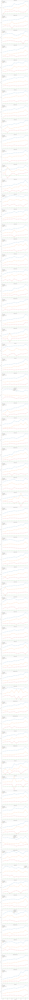

In [ ]:
unique_county_name = grouped_county['county_name'].unique()
county_dfs = [grouped_county[grouped_county['county_name'] == county_name] for county_name in unique_county_name]

# Plot the changes for each county
fig, axes = plt.subplots(len(county_dfs), 1, figsize=(12, 6*len(county_dfs)), sharex=True)
for i, county_df in enumerate(county_dfs):
    county_df.plot(x='state_fiscal_year', y=['ticket_sales', 'prizes_paid', 'retailer_commissions', 'profit'], marker='o', ax=axes[i])
    axes[i].set_title(f"{unique_county_name[i]} County")
    axes[i].set_xlabel('Fiscal Year')
    axes[i].legend()
    axes[i].set_ylabel('Value')
    axes[i].legend()

plt.tight_layout()
plt.show()

## Q4 & Q5. Split the data into training and testing sets, train a regression model, and evaluate its performance. Predict **retailer commissions** based on ticket sales and other relevant variables.


### Feature engineering

In [ ]:
df_predict = df_cleaned.copy()
df_predict

,county_name,state_fiscal_year,ticket_sales,prizes_paid,retailer_commissions,fips_county_code,latitude,longitude,profit
0,Lebanon,2010,25163421.0,16879292.0,1352910.0,42075.0,40.367597,-76.461826,6931219.0
1,Philadelphia,2010,482418451.0,271563611.0,24839242.0,42101.0,40.004444,-75.140236,186015598.0
2,Forest,2010,2344095.0,1467063.0,124301.0,42053.0,41.513579,-79.237810,752731.0
3,Adams,2010,16020747.0,14805818.0,865786.0,42001.0,39.872096,-77.222243,349143.0
4,Clinton,2010,10164845.0,6180964.0,543356.0,42035.0,41.232863,-77.642838,3440525.0
...,...,...,...,...,...,...,...,...,...
822,Crawford,2021,32265044.0,19045548.0,1754595.0,42039.0,41.685469,-80.113211,11464901.0
823,Bedford,2021,13569603.0,7721048.0,751677.0,42009.0,40.007375,-78.491165,5096878.0
824,Northampton,2021,98681017.0,56405881.0,5655763.0,42095.0,40.754595,-75.312637,36619373.0
825,Clarion,2021,16516794.0,10405396.0,924983.0,42031.0,41.192791,-79.424836,5186415.0


In [ ]:
target = 'retailer_commissions'

In [ ]:
columns_to_drop = ['fips_county_code',	'latitude',	'longitude',	'profit']

In [ ]:
df_predict.drop(columns=columns_to_drop, inplace=True, axis=1)

In [ ]:
df_predict

,county_name,state_fiscal_year,ticket_sales,prizes_paid,retailer_commissions
0,Lebanon,2010,25163421.0,16879292.0,1352910.0
1,Philadelphia,2010,482418451.0,271563611.0,24839242.0
2,Forest,2010,2344095.0,1467063.0,124301.0
3,Adams,2010,16020747.0,14805818.0,865786.0
4,Clinton,2010,10164845.0,6180964.0,543356.0
...,...,...,...,...,...
822,Crawford,2021,32265044.0,19045548.0,1754595.0
823,Bedford,2021,13569603.0,7721048.0,751677.0
824,Northampton,2021,98681017.0,56405881.0,5655763.0
825,Clarion,2021,16516794.0,10405396.0,924983.0


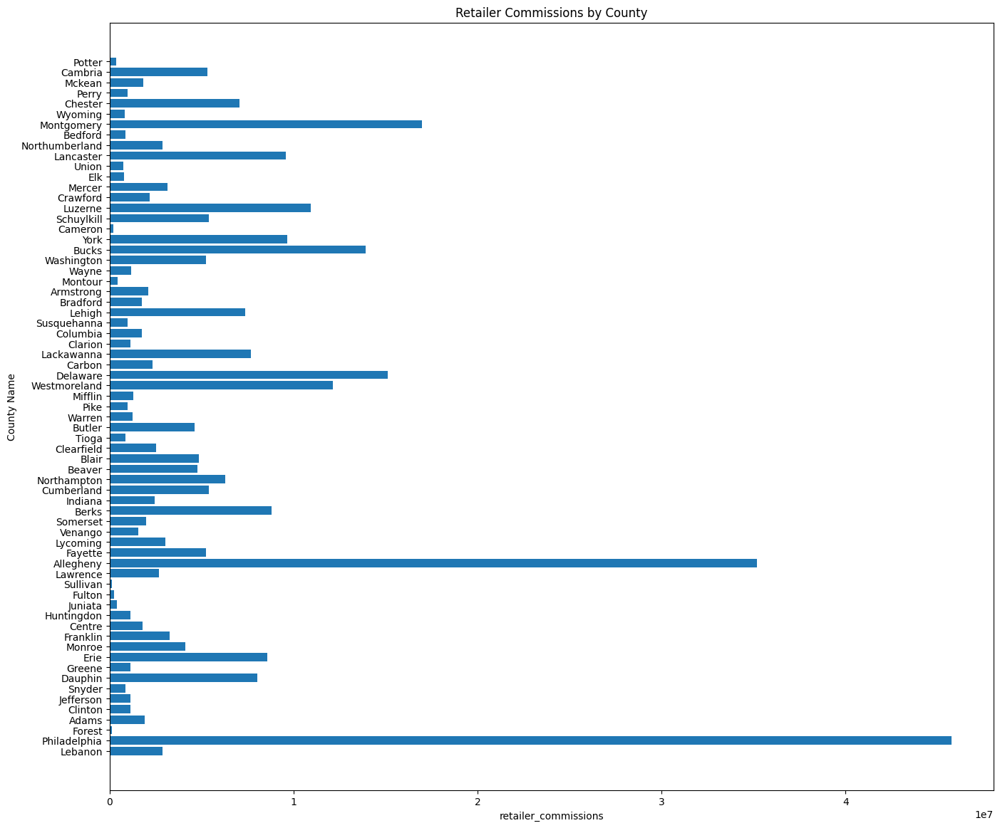

In [ ]:
plt.figure(figsize=(16, 14))

plt.barh(y=df_predict['county_name'], width=df_predict[target])
plt.ylabel('County Name')
plt.xlabel(target)
plt.title('Retailer Commissions by County')
plt.show()



---


The graph shows that each county sets its own retailer fees. This factor can significantly impact the model's prediction ability, so I'll leave this feature as far.
Let's convert this feature to a binary value.

In [ ]:
df_predict = pd.get_dummies(df_predict, columns=['county_name'], drop_first=True)
df_predict

,state_fiscal_year,ticket_sales,prizes_paid,retailer_commissions,county_name_Allegheny,county_name_Armstrong,county_name_Beaver,county_name_Bedford,county_name_Berks,county_name_Blair,...,county_name_Susquehanna,county_name_Tioga,county_name_Union,county_name_Venango,county_name_Warren,county_name_Washington,county_name_Wayne,county_name_Westmoreland,county_name_Wyoming,county_name_York
0,2010,25163421.0,16879292.0,1352910.0,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,2010,482418451.0,271563611.0,24839242.0,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,2010,2344095.0,1467063.0,124301.0,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,2010,16020747.0,14805818.0,865786.0,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,2010,10164845.0,6180964.0,543356.0,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
822,2021,32265044.0,19045548.0,1754595.0,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
823,2021,13569603.0,7721048.0,751677.0,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
824,2021,98681017.0,56405881.0,5655763.0,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
825,2021,16516794.0,10405396.0,924983.0,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


### Correlation

<ipython-input-3-4abf3171d7c4>:58: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=75)


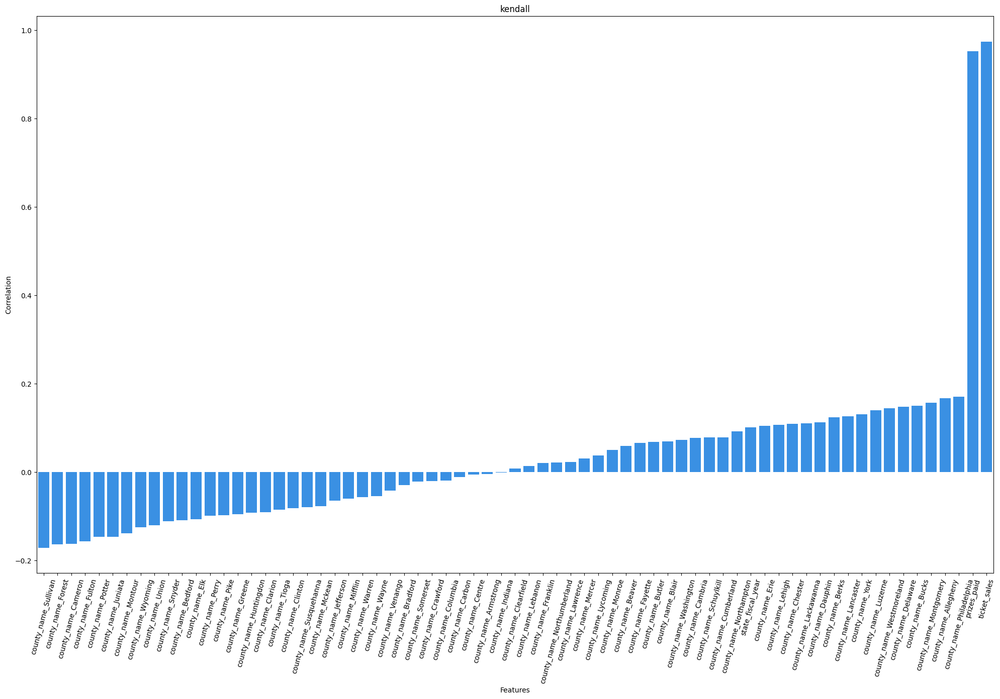

Correlation table with target feature 'retailer_commissions':


Correlation Type,kendall
Column,
ticket_sales,0.974864
prizes_paid,0.952839
county_name_Philadelphia,0.170647
county_name_Allegheny,0.167325
county_name_Montgomery,0.156637
...,...
county_name_Potter,-0.146924
county_name_Fulton,-0.157179
county_name_Cameron,-0.162884



Top 2 features with highest correlation (Kendall): ['ticket_sales', 'prizes_paid']


In [ ]:
correlation_analysis(df_predict, target_feature=target, correlation_types=['kendall'], apply_abs=False)



---

Check multicollinearity

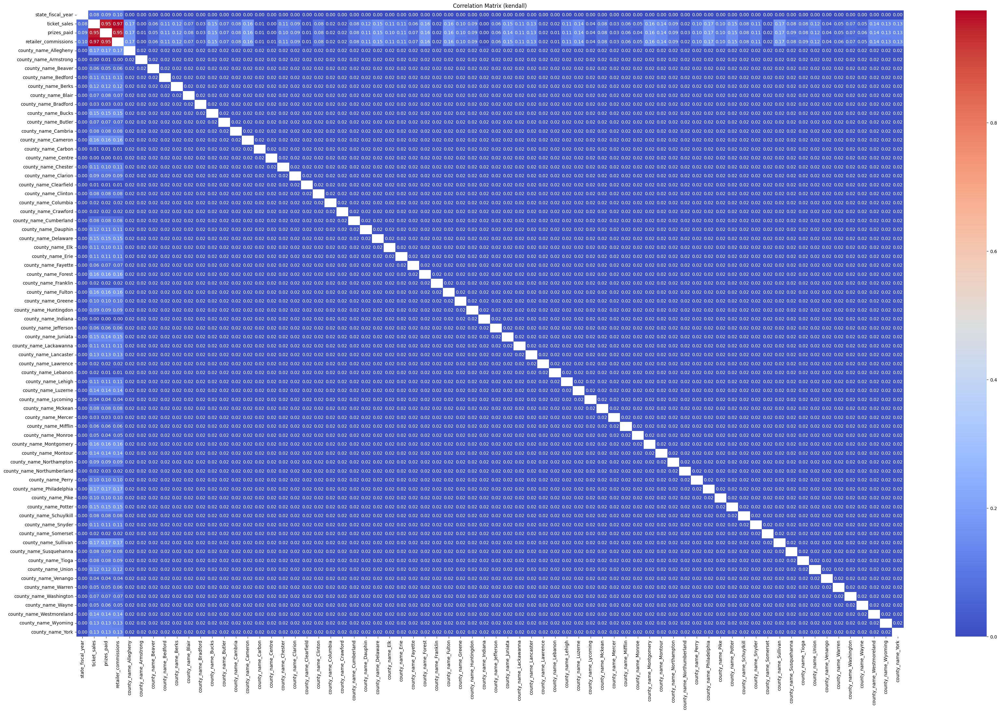


Multicollinearity Table (kendall)


,Feature 1,Feature 2,Correlation
1,ticket_sales,retailer_commissions,0.974864
0,ticket_sales,prizes_paid,0.952944
2,prizes_paid,retailer_commissions,0.952839


In [ ]:
find_multicollinearity(df_predict, methods=['kendall'], threshold=0.7)

Summary:
1. The target feature 'retailer_commissions' has a very high positive correlation with 'ticket_sales' (0.974864) and 'prizes_paid' (0.952839), indicating a strong linear relationship between these features.
2. The county_name features have relatively lower correlations with the target feature.
3. The multicollinearity table shows that 'ticket_sales' and 'prizes_paid' have a very high correlation (0.952944), indicating a potential issue of multicollinearity.


---


**Feature Sellection:**

Given the high correlations between the target feature 'retailer_commissions' and the features 'ticket_sales' and 'prizes_paid', as well as the high multicollinearity between 'ticket_sales' and 'prizes_paid', it is better to keep only one of these highly correlated features in the model. Retaining both 'ticket_sales' and 'prizes_paid' may lead to unstable and unreliable model performance due to multicollinearity.

The *county_name *features can be included in the model, as they have relatively lower correlations with the target feature, but their contribution to the model's performance should be carefully evaluated.


Due to the small amount of data, I decide to select three datasets for training:
1. the simplest consisting of one feature: 'ticket_sales'
2. dataset of two features: 'ticket_sales' and 'prizes_paid'
3. dataset of all features (without 'state_fiscal_year')

### Feature Selection

In [ ]:
y = df_predict['retailer_commissions']

In [ ]:
X_s = df_predict[['ticket_sales']]
X_s.head()

,ticket_sales
0,25163421.0
1,482418451.0
2,2344095.0
3,16020747.0
4,10164845.0


In [ ]:
X = df_predict[['ticket_sales', 'prizes_paid']]
X.head()

,ticket_sales,prizes_paid
0,25163421.0,16879292.0
1,482418451.0,271563611.0
2,2344095.0,1467063.0
3,16020747.0,14805818.0
4,10164845.0,6180964.0


In [ ]:
X_f = df_predict.drop(['state_fiscal_year', 'retailer_commissions'], axis=1)
X_f.head()

,ticket_sales,prizes_paid,county_name_Allegheny,county_name_Armstrong,county_name_Beaver,county_name_Bedford,county_name_Berks,county_name_Blair,county_name_Bradford,county_name_Bucks,...,county_name_Susquehanna,county_name_Tioga,county_name_Union,county_name_Venango,county_name_Warren,county_name_Washington,county_name_Wayne,county_name_Westmoreland,county_name_Wyoming,county_name_York
0,25163421.0,16879292.0,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,482418451.0,271563611.0,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,2344095.0,1467063.0,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,16020747.0,14805818.0,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,10164845.0,6180964.0,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


### Split the data

In [ ]:
# Time-based train-test split (70% train, 30% test)
train_size = int(len(X) * 0.7)


X_train_s, X_test_s = X_s.iloc[:train_size], X_s.iloc[train_size:] # Simple Dataset
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:] #  Dataset
X_train_f, X_test_f = X_f.iloc[:train_size], X_f.iloc[train_size:] # Full Dataset'


y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

### Train

#### Baseline model

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import time


model = LinearRegression()


datasets = [
    ('Simple Dataset', X_train_s, X_test_s, y_train, y_test),
    ('Dataset', X_train, X_test, y_train, y_test),
    ('Full Dataset', X_train_f, X_test_f, y_train, y_test)
]


for dataset_name, X_train, X_test, y_train, y_test in datasets:
    start_time = time.time()


    model.fit(X_train, y_train)


    cv = 10
    scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='r2')
    mean_r2_cv = scores.mean()


    y_test_pred = model.predict(X_test)

    r2_test = r2_score(y_test, y_test_pred)

    end_time = time.time()
    training_time = end_time - start_time

    print(f'Dataset: {dataset_name}')
    print(f'Training Time: {training_time:.4f} seconds')
    print(f'Average cross-validated R-squared: {mean_r2_cv}')
    print(f'Test R-squared: {r2_test}')
    print('--------------------------------------')

Dataset: Simple Dataset
Training Time: 0.0743 seconds
Average cross-validated R-squared: 0.99808228540834
Test R-squared: 0.9810818967585242
--------------------------------------
Dataset: Dataset
Training Time: 0.0615 seconds
Average cross-validated R-squared: 0.998063686528746
Test R-squared: 0.9820072361440154
--------------------------------------
Dataset: Full Dataset
Training Time: 0.1222 seconds
Average cross-validated R-squared: 0.9973942339818238
Test R-squared: 0.9930617426627587
--------------------------------------




---



**Model selection:**

The **Dataset** shows the highest R-squared on both the cross-validation and test data sets (close to 0.9931), indicating the good quality of the model's predictions on new data.
The training time for the **Dataset** is slightly higher compared to the **Simple Dataset**', but this is compensated by the better quality of predictions.

Thus, as the baseline model I consider the **Dataset** model.

#### Ensemble Models

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import r2_score
import time


models = [
    ('Random Forest', RandomForestRegressor(n_estimators=100, random_state=42)),
    ('Gradient Boosting', GradientBoostingRegressor(n_estimators=100, random_state=42))
]

datasets = [
    ('Dataset', X_train, X_test, y_train, y_test),
    ('Full Dataset', X_train_f, X_test_f, y_train, y_test)
]

# Perform training and evaluation for each combination of model and dataset
for model_name, model in models:
    for dataset_name, X_train, X_test, y_train, y_test in datasets:
        print(f'Model: {model_name}, Dataset: {dataset_name}')
        start_time = time.time()

        model.fit(X_train, y_train)
        cv = 10
        scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='r2')
        mean_r2_cv = scores.mean()


        y_test_pred = model.predict(X_test)
        r2_test = r2_score(y_test, y_test_pred)
        end_time = time.time()
        training_time = end_time - start_time

        print(f'Training Time: {training_time:.4f} seconds')
        print(f'Average cross-validated R-squared: {mean_r2_cv}')
        print(f'Test R-squared: {r2_test}')
        print('--------------------------------------')

Model: Random Forest, Dataset: Dataset
Training Time: 3.3884 seconds
Average cross-validated R-squared: 0.9946285777107793
Test R-squared: 0.9608737022415083
--------------------------------------
Model: Random Forest, Dataset: Full Dataset
Training Time: 3.3063 seconds
Average cross-validated R-squared: 0.9946285777107793
Test R-squared: 0.9608737022415083
--------------------------------------
Model: Gradient Boosting, Dataset: Dataset
Training Time: 1.7306 seconds
Average cross-validated R-squared: 0.9954211158739981
Test R-squared: 0.9735446987150317
--------------------------------------
Model: Gradient Boosting, Dataset: Full Dataset
Training Time: 2.1121 seconds
Average cross-validated R-squared: 0.9954211158739981
Test R-squared: 0.9735446987150317
--------------------------------------


Linear regression on this dataset demonstrates the best results in terms of the R-squared metric on the validation dataset among all the models considered.

### Test

In [ ]:
# Predict on the test set
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error


model = LinearRegression()
model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)



# Evaluate on the train set
mae_train = mean_absolute_error(y_train, y_train_pred)
mape_train = mean_absolute_percentage_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Evaluate on the test set
mae_test = mean_absolute_error(y_test, y_test_pred)
mape_test = mean_absolute_percentage_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)



print(f'Train MAE: {mae_train}')
print(f'Test MAE: {mae_test}')
print('*' * 35)
print(f'Train MAPE: {mape_train}')
print(f'Test MAPE: {mape_test}')
print('*' * 35)
print(f'Train R-squared: {r2_train}')
print(f'Test R-squared: {r2_test}')

Train MAE: 68759.75617171219
Test MAE: 228130.12566471362
***********************************
Train MAPE: 0.02394669307518136
Test MAPE: 0.053492150667980236
***********************************
Train R-squared: 0.9983892518342447
Test R-squared: 0.9930617426627587


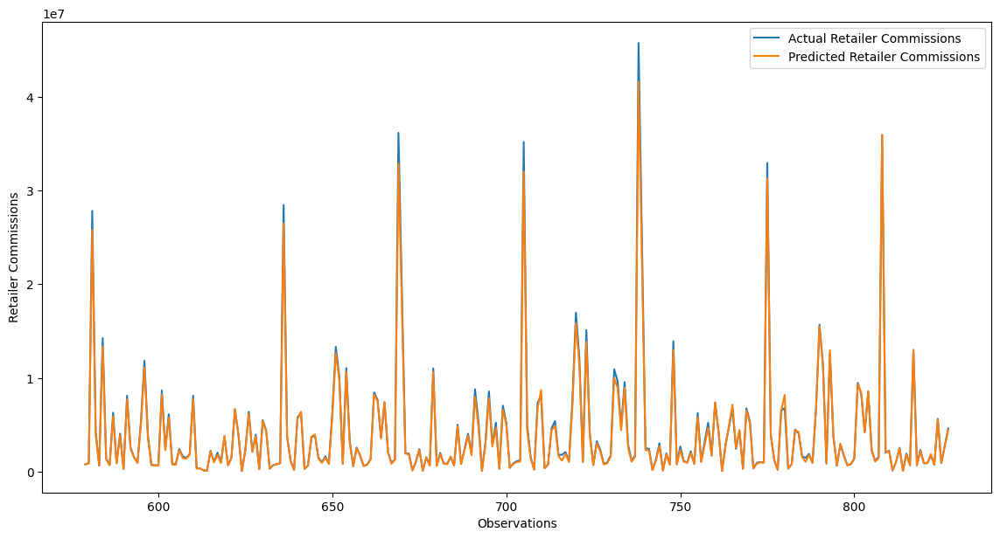

In [ ]:
# Plotting predictions vs actuals
plt.figure(figsize=(14, 7))
plt.plot(y_test.index, y_test, label='Actual Retailer Commissions')
plt.plot(y_test.index, y_test_pred, label='Predicted Retailer Commissions')
plt.xlabel('Observations')
plt.ylabel('Retailer Commissions')
plt.legend()
plt.show()

# Conclustion

**Average Company Profit:**

- The average company profit is 19422794.62$, it was calculated as the mean of the difference between ticket sales, prizes paid, and retailer commissions.

- The profit trend shows a consistent upward trend over the analyzed period (2010-2021). Significant spike in profits were observed in 2015, aligning with increases in ticket sales that outpaced growth in prizes paid during those years.

**Changes Over Fiscal Years:**

- *Ticket Sales:* There is a steady growth trend in ticket sales from 2010 onwards, with a notable peak in 2020.
- *Prizes Paid:* Similarly, prizes paid increased over the years, following the overall growth trend in ticket sales and reaching a peak in 2020.
- *Retailer Commissions:* Retailer commissions also showed gradual growth throughout the analyzed period, reflecting the increasing sales and payouts.


**Seasonal Patterns and Anomalies:**

- *Seasonal Patterns:* No significant seasonal variations were detected in ticket sales data across fiscal years. This suggests consistent consumer behavior throughout the year.
- *Anomalies:*Identified anomalies, primarily outliers, were found to follow distinct patterns. These anomalies can be attributed to events such as intensive marketing campaigns, jackpot wins, or special events and holidays, which temporarily boosted sales and prizes paid.

**Regression Model Performance:**

- Model Selection: Various regression models were evaluated, including Linear Regression and Ensemble methods (Random Forest, Gradient Boosting).
Feature Importance: *Ticket sales* and *prizes paid* were identified as highly influential features in predicting retailer commissions, exhibiting strong positive correlations.

- Model Accuracy: The selected model, particularly the Dataset model (including ticket sales and prizes paid), demonstrated robust performance with high R-squared values (close to 0.993) on both training and testing datasets.
Evaluation Metrics: Metrics such as Mean Absolute Error (MAE) and Mean Absolute Percentage Error (MAPE) indicated the model's ability to predict retailer commissions accurately.

**Strategic Implications**

The findings suggest several strategic implications for stakeholders in the lottery industry:

Revenue Optimization: Focus on leveraging periods of peak sales to maximize profitability, potentially through targeted marketing efforts or promotions during identified anomaly periods.
Forecasting and Planning: Reliable regression models can support proactive decision-making by forecasting future retailer commissions based on historical sales data and related variables.



Tableau link: https://public.tableau.com/app/profile/dmitrii.kalenov/viz/TrendsbyCountyandFiscalYear/TrendsbyCountyandFiscalYear?publish=yes